In [2]:
import scanpy as sc
import os
import pandas as pd
import numpy as np
from anndata import AnnData, read_csv
import seaborn as sns
from matplotlib import pyplot as plt
from glob import glob

In [ ]:
from time import gmtime, strftime
strftime("%Y-%m-%d %H:%M:%S", gmtime())

In [3]:
mainDir = "/mnt/gmi-l1/_90.User_Data/revolvefire/FASTQ"

In [4]:
objectDir = "/data/User/revolvefire/projects/1.ATAC_230519/230808_scRNA_new/scobject/"

In [5]:
adata = sc.read(objectDir + "250211.adata.integrated.fullgene.LABELED_fixed.h5ad")

Only considering the two last: ['.LABELED_fixed', '.h5ad'].
Only considering the two last: ['.LABELED_fixed', '.h5ad'].


/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [6]:
print("Categories:", adata.obs["label"].cat.categories)
if "label_colors" in adata.uns:
    print("Current color palette:", adata.uns["label_colors"])
else:
    print("No color palette found for 'label' in adata.uns.")

Categories: Index(['APM', 'BK-1', 'BK-2', 'BK-3', 'Chond-Fib', 'Coch-Fib', 'DC/DP', 'DP',
       'DS', 'FIB-1', 'FIB-2', 'FIB-3', 'FIB-4', 'HFKC-1', 'HFKC-2', 'HP/HG',
       'LEC', 'Lymphocyte', 'Mac-1', 'Mac-2', 'Mast', 'Mast-low', 'Melanocyte',
       'Merkel', 'Muscle', 'Neutrophil', 'Pericyte', 'Pre-adipo', 'SBK',
       'Schwann', 'VEC', 'emFIB-1', 'emFIB-2', 'emK'],
      dtype='object')
Current color palette: ['#ffff00' '#1ce6ff' '#ff34ff' '#ff4a46' '#008941' '#006fa6' '#a30059'
 '#ffdbe5' '#7a4900' '#0000a6' '#63ffac' '#b79762' '#004d43' '#8fb0ff'
 '#997d87' '#5a0007' '#809693' '#6a3a4c' '#1b4400' '#4fc601' '#3b5dff'
 '#4a3b53' '#ff2f80' '#61615a' '#ba0900' '#6b7900' '#00c2a0' '#ffaa92'
 '#ff90c9' '#b903aa' '#d16100' '#ddefff' '#000035' '#7b4f4b']


In [7]:
import pandas as pd

desired_order = [
    'APM', 'BK-1', 'BK-2', 'BK-3', 'Chond-Fib', 'Coch-Fib', 'DC/DP', 'DP', 'DS',
    'FIB-1', 'FIB-2', 'FIB-3', 'FIB-4', 'HFKC-1', 'HFKC-2', 'HP/HG', 'LEC', 'Lymphocyte',
    'Mac-1', 'Mac-2', 'Mast', 'Mast-low', 'Melanocyte', 'Merkel', 'Muscle', 'Neutrophil',
    'Pericyte', 'Pre-adipo', 'SBK', 'Schwann', 'VEC', 'emFIB-1', 'emFIB-2', 'emK'
]

custom_palette = [
    '#ff4a46', '#1ce6ff', '#ffdbe5', '#ffff00', '#008941', '#006fa6', '#a30059',
    '#ff34ff', '#7a4900', '#0000a6', '#63ffac', '#b79762', '#004d43', '#161673',
    '#997d87', '#5a0007', '#809693', '#6a3a4c', '#1b4400', '#4fc601', '#3b5dff',
    '#4a3b53', '#ff2f80', '#adad18', '#ba0900', '#6b7900', '#00c2a0', '#ffaa92',
    '#466b8c', '#b903aa', '#d16100', '#8fb0ff', '#ff90c9', '#7b4f4b'
]

adata.obs['label'] = adata.obs['label'].astype('category')
adata.obs['label'] = adata.obs['label'].cat.set_categories(desired_order, ordered=True)
adata.uns['label_colors'] = custom_palette

print("Label categories:", adata.obs['label'].cat.categories)
print("Assigned color palette:", adata.uns['label_colors'])

Label categories: Index(['APM', 'BK-1', 'BK-2', 'BK-3', 'Chond-Fib', 'Coch-Fib', 'DC/DP', 'DP',
       'DS', 'FIB-1', 'FIB-2', 'FIB-3', 'FIB-4', 'HFKC-1', 'HFKC-2', 'HP/HG',
       'LEC', 'Lymphocyte', 'Mac-1', 'Mac-2', 'Mast', 'Mast-low', 'Melanocyte',
       'Merkel', 'Muscle', 'Neutrophil', 'Pericyte', 'Pre-adipo', 'SBK',
       'Schwann', 'VEC', 'emFIB-1', 'emFIB-2', 'emK'],
      dtype='object')
Assigned color palette: ['#ff4a46', '#1ce6ff', '#ffdbe5', '#ffff00', '#008941', '#006fa6', '#a30059', '#ff34ff', '#7a4900', '#0000a6', '#63ffac', '#b79762', '#004d43', '#161673', '#997d87', '#5a0007', '#809693', '#6a3a4c', '#1b4400', '#4fc601', '#3b5dff', '#4a3b53', '#ff2f80', '#adad18', '#ba0900', '#6b7900', '#00c2a0', '#ffaa92', '#466b8c', '#b903aa', '#d16100', '#8fb0ff', '#ff90c9', '#7b4f4b']


In [8]:
sc.set_figure_params(dpi=300, fontsize=14)

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/

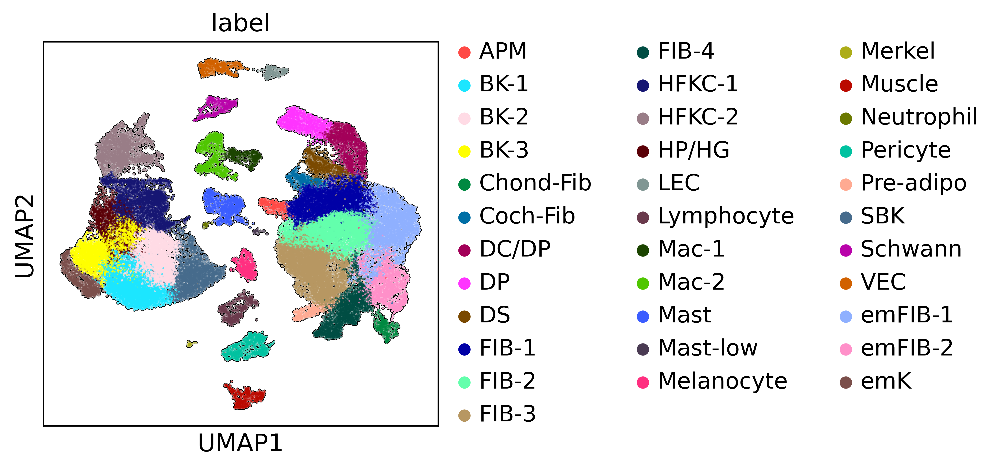

In [9]:
sc.pl.umap(adata, color='label', add_outline=True, size=5, )

In [10]:
new_order = ['emFIB-1', 'emFIB-2', 'FIB-1', 'FIB-2', 'FIB-3', 'FIB-4', 'Pre-adipo', 'DS', 'DC/DP', 'DP', 'APM', 'Coch-Fib', 'Chond-Fib', 
             'emK', 'HP/HG', 'HFKC-1', 'HFKC-2', 'BK-1', 'BK-2', 'BK-3', 'SBK',  'Mast', 'Mast-low', 'Neutrophil', 'Lymphocyte', 'Mac-1', 'Mac-2',  'Merkel', 'Muscle', 'Pericyte', 'Schwann', 'Melanocyte', 'VEC', 'LEC'
]

In [11]:
adata.obs["label"] = adata.obs["label"].cat.reorder_categories(new_order, ordered=True)


In [12]:
adata.layers["scaled"] = sc.pp.scale(adata, copy=True).X

In [13]:
markers=['Crabp1', 'Twist2', 'Pdgfra', 'Dpp4', 'Wif1', 'Apcdd1', 'Dlk1', 'Agtr2', 'Fabp4', 'Mfap5', 'Ebf2', 'Meox2', 'Igfbp7',  'Col11a1', 'Cd200',  'Acan', 'Sox18', 'Cxcr4', 'Sox2', 'Alpl', 'Alx4', 'Col23a1', 'Actg2', 'Itga8', 'Coch', 'Matn4', 'Dlx5', 'Trp63', 'Lhx2', 'Edar', 'Barx2', 'Sox9', 'Il11ra1', 'Krt79', 'Sostdc1', 'Apoe', 'Msx2', 'Krt71', 'Krt5', 'Krt14', 'Krt1', 'Krt10', 'Cpa3', 'Mcpt4', 'Cxcr2', 'Itgam', 'Ptprc', 'Cd3g', 'Cd68', 'Cd86', 'Mrc1', 'Cd163', 'Krt8', 'Krt18', 'Msc', 'Ttn', 'Pax7','Rgs5', 'Sox10',  'Dct', 'Tyr',  'Pecam1', 'Cdh5', 'Lyve1']
sc.pl.dotplot(adata, markers, groupby='label', cmap="RdBu_r", figsize=(23,10), layer="scaled", vmax=3, vmin=-2, 
    colorbar_title="mean z-score",)

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_do

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_do

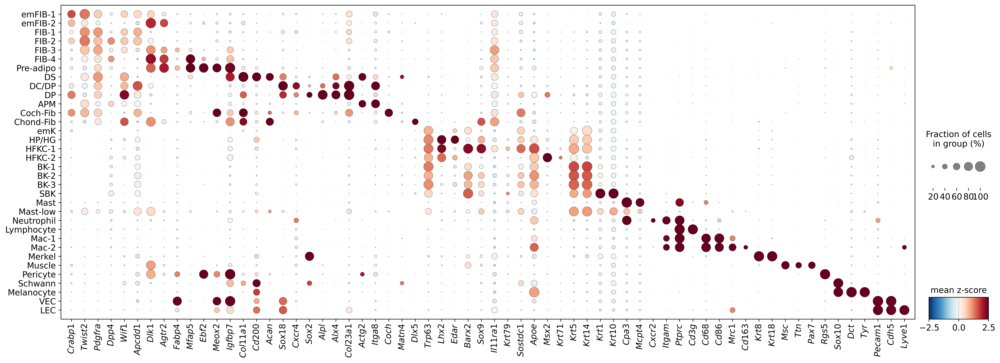

In [14]:
sc.pl.dotplot(
    adata,
    markers,
    groupby='label',
    use_raw=False,
    cmap='RdBu_r',
    figsize=(23,8),
    layer='scaled',
    show=False, colorbar_title="mean z-score", vmax=2.5, vmin=-2.5,  
)

fig = plt.gcf()

for ax in fig.axes:
    tick_labels = [tick.get_text() for tick in ax.get_xticklabels()]
    italic_labels = [f"$\\mathit{{{label}}}$" for label in tick_labels]
    ax.set_xticklabels(italic_labels, )

fig.savefig("250303.scRNA.marker.svg", dpi=300, format="svg", bbox_inches="tight")
plt.show()